# Laboratorio #8

* Josue Say - 228801
* Flavio Galán - 22386

## Repositorio

- [Enlace](https://github.com/JosueSay/labs-ds/tree/main/lab8)
- [Data](https://www.ine.gob.gt/bases-de-datos/accidentes-de-transito/)

## Librerías

In [0]:
from pyspark.sql import SparkSession, functions as F, types as T
from pyspark.sql.window import Window
import matplotlib.pyplot as plt
import numpy as np

## Limpieza y pipeline

Se hizo en el notebook `lab8.ipynb` del repositorio.

## Carga de Datos y Análisis Exploratorio

### Cargar en Spark (Databricks)

In [0]:
BASE = "/Volumes/workspace/default/transito_gt"

HECHOS_CSV    = f"{BASE}/hechos_combinado.csv"
VEHICULOS_CSV = f"{BASE}/vehiculos_combinado.csv"
FL_CSV        = f"{BASE}/fl_combinado.csv"

In [0]:
# Lectura con Spark
hechos = (spark.read.option("header", True).option("inferSchema", True).csv(HECHOS_CSV))
vehiculos = (spark.read.option("header", True).option("inferSchema", True).csv(VEHICULOS_CSV))
fl = (spark.read.option("header", True).option("inferSchema", True).csv(FL_CSV))

In [0]:
display(hechos)
display(vehiculos)
display(fl)

mes_ocu,dia_sem_ocu,hora_ocu,g_hora,depto_ocu,mupio_ocu,zona_ocu,tipo_veh,color_veh,modelo_veh,marca_veh,anio_ocu_file,tipo_eve,num_corre,anio_ocu_dataset,anio_ocu
enero,martes,3,1,1,106,6,pick up,ignorado,9999,jmc,2013,choque,1,null,2013
enero,martes,5,1,1,101,11,automovil,blanco,2010,avanti,2013,choque,2,null,2013
enero,martes,3,1,1,108,3,automovil,gris,9999,genesis,2013,colision,3,null,2013
enero,martes,0,1,19,1901,99,motocicleta,rojo,2012,great wall,2013,choque,4,null,2013
enero,martes,18,4,19,1901,99,pick up,rojo,9999,land rover,2013,vuelco,5,null,2013
enero,martes,0,1,5,502,99,motocicleta,negro,2001,tvs apache,2013,choque,6,null,2013
enero,martes,11,2,9,901,99,camioneta,negro,9999,land rover,2013,choque,7,null,2013
enero,martes,1,1,12,1217,99,camion,verde,1992,jeep,2013,colision,8,null,2013
enero,martes,7,2,13,1322,99,pick up,ignorado,9999,land rover,2013,vuelco,9,null,2013
enero,martes,8,2,16,1604,99,camion,blanco,1999,freightliner,2013,choque,10,null,2013


mes_ocu,dia_sem_ocu,hora_ocu,depto_ocu,mupio_ocu,zona_ocu,mayor_menor,tipo_veh,color_veh,modelo_veh,marca_veh,anio_ocu_file,tipo_eve,estado_con,g_modelo_veh,sex_cond,edad_con,edad_con_grupo,num_corre,g_hora,anio_ocu_dataset,anio_ocu
enero,martes,3,1,106,6,mayor,pick up,ignorado,6,jmc,2013,choque,ebrio,ignorado,hombre,32,30-34,1,0,null,2013
enero,martes,5,1,101,11,mayor,automovil,blanco,5,avanti,2013,choque,ebrio,2010-2019,hombre,34,30-34,2,0,null,2013
enero,martes,3,1,108,3,mayor,automovil,gris,6,genesis,2013,colision,ebrio,ignorado,hombre,28,25-29,3,0,null,2013
enero,martes,3,1,108,3,mayor,pick up,verde,4,land rover,2013,colision,no ebrio,2000-2009,hombre,43,40-44,4,0,null,2013
enero,martes,0,19,1901,99,mayor,motocicleta,rojo,5,great wall,2013,choque,no ebrio,2010-2019,hombre,21,20-24,5,0,null,2013
enero,martes,18,19,1901,99,mayor,pick up,rojo,6,land rover,2013,vuelco,ignorado,ignorado,hombre,19,15-19,6,0,null,2013
enero,martes,0,5,502,99,mayor,motocicleta,negro,4,tvs apache,2013,choque,no ebrio,2000-2009,hombre,24,20-24,7,0,null,2013
enero,martes,11,9,901,99,mayor,camioneta,negro,6,land rover,2013,choque,ebrio,ignorado,hombre,36,35-39,8,0,null,2013
enero,martes,1,12,1217,99,mayor,camion,verde,3,jeep,2013,colision,no ebrio,1990-1999,hombre,38,35-39,9,0,null,2013
enero,martes,1,12,1217,99,mayor,motocicleta,azul,6,kenworth,2013,colision,ebrio,ignorado,ignorado,999,ignorado,10,0,null,2013


mes_ocu,dia_sem_ocu,hora_ocu,g_hora,depto_ocu,mupio_ocu,zona_ocu,mayor_menor,tipo_veh,color_veh,modelo_veh,marca_veh,anio_ocu_file,tipo_eve,edad_grupo,fall_les,sexo_vic,int_o_noint,num_corre,anio_ocu_dataset,anio_ocu,edad_vic
enero,martes,5,1,1,101,11,mayor,automovil,blanco,5,avanti,2013,choque,30-34,lesionado,ignorado,ignorado,1,null,2013,-1
enero,martes,5,1,1,101,11,menor,automovil,blanco,5,avanti,2013,choque,15-19,lesionado,ignorado,ignorado,2,null,2013,-1
enero,martes,5,1,1,101,11,mayor,automovil,blanco,5,avanti,2013,choque,30-34,lesionado,ignorado,ignorado,3,null,2013,-1
enero,martes,0,1,19,1901,99,mayor,motocicleta,rojo,5,great wall,2013,choque,20-24,fallecimiento,ignorado,ignorado,4,null,2013,-1
enero,martes,0,1,19,1901,99,mayor,motocicleta,rojo,5,great wall,2013,choque,20-24,lesionado,ignorado,ignorado,5,null,2013,-1
enero,martes,18,4,19,1901,99,mayor,pick up,rojo,6,land rover,2013,vuelco,15-19,lesionado,ignorado,ignorado,6,null,2013,-1
enero,martes,18,4,19,1901,99,menor,pick up,rojo,6,land rover,2013,vuelco,menor de 15,lesionado,ignorado,ignorado,7,null,2013,-1
enero,martes,18,4,19,1901,99,menor,pick up,rojo,6,land rover,2013,vuelco,menor de 15,lesionado,ignorado,ignorado,8,null,2013,-1
enero,martes,18,4,19,1901,99,mayor,pick up,rojo,6,land rover,2013,vuelco,20-24,lesionado,ignorado,ignorado,9,null,2013,-1
enero,martes,18,4,19,1901,99,menor,pick up,rojo,6,land rover,2013,vuelco,15-19,lesionado,ignorado,ignorado,10,null,2013,-1


In [0]:
spark = SparkSession.builder.getOrCreate()

### 1. Conteo, muestra y estadísticas descriptivas por dataset

In [0]:
def showProfile(name, df, importantCols=None, sampleN=5):
    """
    Muestra: count, .show() de muestra, describe y summary para columnas importantes.
    - name: etiqueta del dataset (str)
    - df: DataFrame de Spark
    - importantCols: lista de columnas relevantes (opcional)
    - sampleN: filas a mostrar con .show()
    """
    countVal = df.count()
    print(f"=== {name}: {countVal} registros ===")
    df.show(sampleN, truncate=False)

    if importantCols:
        cols = [c for c in importantCols if c in df.columns]
        if cols:
            print(f"\n— describe({name}) —")
            df.select(*cols).describe().show(truncate=False)
            print(f"\n— summary({name}) —")
            df.select(*cols).summary().show(truncate=False)
        else:
            print(f"(Aviso) Ninguna de las columnas importantes está en {name}: {importantCols}\n")
    else:
        print(f"(Aviso) No se proporcionaron columnas importantes para {name}.\n")

def profileDatasets(hechos, vehiculos, fl,
                    impHechos=None, impVehiculos=None, impFl=None,
                    sampleN=5):
    """
    Ejecuta showProfile para cada dataset con sus columnas importantes.
    """
    showProfile("HECHOS", hechos, importantCols=impHechos, sampleN=sampleN)
    showProfile("VEHICULOS", vehiculos, importantCols=impVehiculos, sampleN=sampleN)
    showProfile("FALLECIDOS_LESIONADOS", fl, importantCols=impFl, sampleN=sampleN)

In [0]:
impHechos = ["anio_ocu","mes_ocu","g_hora","dia_sem_ocu","depto_ocu","tipo_eve","tipo_veh"]
impVehiculos = ["anio_ocu","mes_ocu","g_hora","dia_sem_ocu","depto_ocu","tipo_eve","tipo_veh","sexo_per","estado_con"]
impFl = ["anio_ocu","mes_ocu","g_hora","dia_sem_ocu","depto_ocu","tipo_eve","tipo_veh","fall_les","sexo_vic"]

profileDatasets(
    hechos, vehiculos, fl,
    impHechos=impHechos,
    impVehiculos=impVehiculos,
    impFl=impFl,
    sampleN=5
)

=== HECHOS: 76759 registros ===
+-------+-----------+--------+------+---------+---------+--------+-----------+---------+----------+----------+-------------+--------+---------+----------------+--------+
|mes_ocu|dia_sem_ocu|hora_ocu|g_hora|depto_ocu|mupio_ocu|zona_ocu|tipo_veh   |color_veh|modelo_veh|marca_veh |anio_ocu_file|tipo_eve|num_corre|anio_ocu_dataset|anio_ocu|
+-------+-----------+--------+------+---------+---------+--------+-----------+---------+----------+----------+-------------+--------+---------+----------------+--------+
|enero  |martes     |3       |1     |1        |106      |6       |pick up    |ignorado |9999      |jmc       |2013         |choque  |1        |NULL            |2013    |
|enero  |martes     |5       |1     |1        |101      |11      |automovil  |blanco   |2010      |avanti    |2013         |choque  |2        |NULL            |2013    |
|enero  |martes     |3       |1     |1        |108      |3       |automovil  |gris     |9999      |genesis   |2013    

* Se tiene un volumen de **76,759 hechos**, **111,988 vehículos** y **109,417 víctimas**.
* Los registros abarcan de **2013 a 2023**, con mayor cantidad en los años recientes.
* Las horas más frecuentes de ocurrencia están entre **mediodía–tarde (g_hora $\approx$ 3)** y **tarde–noche (g_hora $\approx$ 4)**.
* Los eventos más comunes son **choques y colisiones**, con vehículos tipo **automóvil, pick up y motocicleta**.
* En los datos de **fallecidos y lesionados** predominan los **lesionados**, aunque también se reportan **fallecimientos**.
* Los departamentos más frecuentes corresponden a los más poblados del país, destacando áreas urbanas con mayor tránsito.
* Los **departamentos con más casos** reportados son:
    * **1 (Guatemala)**
    * **5 (Escuintla)**
    * **10 (Suchitepéquez)**
    * **9 (Quetzaltenango)**
    * **12 (San Marcos)**

### 2. Validación de años disponibles por dataset

In [0]:
def compareYears(df, name="Dataset"):
    """
    Compara columnas de año: anio_ocu_dataset vs anio_ocu_file.
    Calcula porcentajes de registros que:
      - Tienen año en el dataset
      - Coinciden ambos años
      - Solo tienen año por archivo
    """
    total = df.count()

    # Registros que tienen año en el dataset
    withDatasetYear = df.filter(F.col("anio_ocu_dataset").isNotNull()).count()

    # Registros que tienen año en el archivo
    withFileYear = df.filter(F.col("anio_ocu_file").isNotNull()).count()

    # Coinciden ambos años
    bothMatch = (
        df.filter(
            (F.col("anio_ocu_dataset").isNotNull()) &
            (F.col("anio_ocu_file").isNotNull()) &
            (F.col("anio_ocu_dataset") == F.col("anio_ocu_file"))
        ).count()
    )

    # Porcentajes
    pctDataset = round((withDatasetYear / total) * 100, 2) if total > 0 else 0
    pctFile = round((withFileYear / total) * 100, 2) if total > 0 else 0
    pctMatch = round((bothMatch / withDatasetYear) * 100, 2) if withDatasetYear > 0 else 0

    print(f"=== {name} ===")
    print(f"Total registros: {total}")
    print(f"Con año en dataset interno: {withDatasetYear} ({pctDataset}%)")
    print(f"Con año en nombre de archivo: {withFileYear} ({pctFile}%)")
    print(f"Coincidencia entre ambos: {bothMatch} ({pctMatch}% de los que tenían año interno)")
    print(f"Sin año interno (solo file): {total - withDatasetYear} ({round(100 - pctDataset, 2)}%)")
    print()

In [0]:
compareYears(hechos, "HECHOS")
compareYears(vehiculos, "VEHICULOS")
compareYears(fl, "FALLECIDOS_LESIONADOS")

=== HECHOS ===
Total registros: 76759
Con año en dataset interno: 64784 (84.4%)
Con año en nombre de archivo: 76759 (100.0%)
Coincidencia entre ambos: 64784 (100.0% de los que tenían año interno)
Sin año interno (solo file): 11975 (15.6%)

=== VEHICULOS ===
Total registros: 111988
Con año en dataset interno: 87938 (78.52%)
Con año en nombre de archivo: 111988 (100.0%)
Coincidencia entre ambos: 87938 (100.0% de los que tenían año interno)
Sin año interno (solo file): 24050 (21.48%)

=== FALLECIDOS_LESIONADOS ===
Total registros: 109417
Con año en dataset interno: 91367 (83.5%)
Con año en nombre de archivo: 109417 (100.0%)
Coincidencia entre ambos: 91367 (100.0% de los que tenían año interno)
Sin año interno (solo file): 18050 (16.5%)



* En **HECHOS**, el **84.4%** de los registros contiene año dentro del dataset y todos coinciden con el año obtenido del archivo. El **15.6%** restante no tiene año interno y solo se identificó por el nombre del archivo.
* En **VEHÍCULOS**, el **78.5%** posee año en el dataset y coincide completamente con el año del archivo. El **21.5%** restante carece de año interno.
* En **FALLECIDOS_LESIONADOS**, el **83.5%** tiene año interno y coincide con el del archivo, mientras que el **16.5%** no lo tiene.

### 3. Valores distintos de “tipo de accidente”

In [0]:
def showDistinctAccidentTypes(df, name="Dataset", col="tipo_eve"):
    """
    Muestra los valores distintos de tipo de accidente en un DataFrame.
    """
    if col not in df.columns:
        print(f"=== {name}: no tiene la columna '{col}' ===\n")
        return

    distinctValues = (
        df.select(F.col(col))
          .where(F.col(col).isNotNull())
          .distinct()
          .orderBy(F.col(col))
          .collect()
    )

    values = [r[0] for r in distinctValues]
    print(f"=== {name} ===")
    print(f"Total tipos distintos: {len(values)}")
    print(", ".join(values))
    print()

In [0]:
showDistinctAccidentTypes(hechos, "HECHOS")
showDistinctAccidentTypes(vehiculos, "VEHICULOS")
showDistinctAccidentTypes(fl, "FALLECIDOS_LESIONADOS")

=== HECHOS ===
Total tipos distintos: 11
atropello, caida, choque, colision, derrape, desprendimiento, embarranco, encuneto, ignorado, incendio, vuelco

=== VEHICULOS ===
Total tipos distintos: 11
atropello, caida, choque, colision, derrape, desprendimiento, embarranco, encuneto, ignorado, incendio, vuelco

=== FALLECIDOS_LESIONADOS ===
Total tipos distintos: 11
atropello, caida, choque, colision, derrape, desprendimiento, embarranco, encuneto, ignorado, incendio, vuelco



* En los tres datasets se identifican **11 tipos de accidentes distintos**.  Los más comunes son **choque**, **colisión**, **atropello**, **vuelco** y **derrape**, que representan los incidentes de tránsito más frecuentes.

### 4. Departamentos únicos en las bases

In [0]:
def countUniqueDepartments(df, name="Dataset", col="depto_ocu"):
    """
    Calcula cuántos departamentos únicos existen en el DataFrame.
    """
    if col not in df.columns:
        print(f"=== {name}: no tiene la columna '{col}' ===\n")
        return

    uniqueCount = df.select(F.col(col)).where(F.col(col).isNotNull()).distinct().count()
    print(f"=== {name} ===")
    print(f"Departamentos únicos: {uniqueCount}\n")

In [0]:
countUniqueDepartments(hechos, "HECHOS")
countUniqueDepartments(vehiculos, "VEHICULOS")
countUniqueDepartments(fl, "FALLECIDOS_LESIONADOS")

=== HECHOS ===
Departamentos únicos: 22

=== VEHICULOS ===
Departamentos únicos: 22

=== FALLECIDOS_LESIONADOS ===
Departamentos únicos: 22



## Preguntas de análisis

### 5. Accidentes por año y departamento (gráfico de barras)

In [0]:
def totalAccidentsByYearAndDept(df, name="Dataset"):
    """
    Calcula el total de accidentes por año y departamento.
    Muestra los resultados y recomienda usar display() en Databricks.
    """
    if not {"anio_ocu", "depto_ocu"} <= set(df.columns):
        print(f"=== {name}: faltan columnas necesarias ('anio_ocu', 'depto_ocu') ===\n")
        return

    grouped = (
        df.groupBy("anio_ocu", "depto_ocu")
          .count()
          .orderBy("anio_ocu", "depto_ocu")
    )

    print(f"=== {name}: total de accidentes por año y departamento ===")
    grouped.show(20, truncate=False)
    print("\nEn Databricks puedes visualizarlo así:")
    print("display(accidentesPorDepto)  # luego elige gráfico de barras por año y depto_ocu\n")
    return grouped

In [0]:
accidentesPorDepto = totalAccidentsByYearAndDept(hechos, "HECHOS")

=== HECHOS: total de accidentes por año y departamento ===
+--------+---------+-----+
|anio_ocu|depto_ocu|count|
+--------+---------+-----+
|2013    |1        |2267 |
|2013    |2        |132  |
|2013    |3        |142  |
|2013    |4        |212  |
|2013    |5        |424  |
|2013    |6        |214  |
|2013    |7        |126  |
|2013    |8        |81   |
|2013    |9        |288  |
|2013    |10       |269  |
|2013    |11       |133  |
|2013    |12       |221  |
|2013    |13       |201  |
|2013    |14       |151  |
|2013    |15       |100  |
|2013    |16       |219  |
|2013    |17       |214  |
|2013    |18       |234  |
|2013    |19       |229  |
|2013    |20       |204  |
+--------+---------+-----+
only showing top 20 rows

En Databricks puedes visualizarlo así:
display(accidentesPorDepto)  # luego elige gráfico de barras por año y depto_ocu



In [0]:
display(accidentesPorDepto)

anio_ocu,depto_ocu,count
2013,1,2267
2013,2,132
2013,3,142
2013,4,212
2013,5,424
2013,6,214
2013,7,126
2013,8,81
2013,9,288
2013,10,269


Databricks visualization. Run in Databricks to view.

En el gráfico se observa que los accidentes se concentran principalmente en el **departamento de Guatemala (1)**, que mantiene el volumen más alto en todos los años. Le siguen **Escuintla (5)**, **Quetzaltenango (9)**, **Chimaltenango (4)** y **Alta Verapaz (16)**, con participación constante pero menor. Aunque parece haber un **aumento en 2022 y 2023**, este incremento está relacionado con que esos años tienen **más registros en la base de datos** (más de 7,900 y 8,200 filas respectivamente), por lo que el alza no necesariamente implica más accidentes reales, sino una **mayor disponibilidad de datos**. En conjunto, la tendencia se mantiene estable, con ligeras variaciones según la cantidad de información recopilada cada año.

### 6. Día de la semana con más accidentes en 2023 (gráfico de columnas)

In [0]:
def totalAccidentsByDay2023(df, name="Dataset"):
    """
    Calcula el total de accidentes por día de la semana en 2023.
    Muestra resultados y permite usar display() en Databricks.
    """
    if not {"anio_ocu", "dia_sem_ocu"} <= set(df.columns):
        print(f"=== {name}: faltan columnas necesarias ('anio_ocu', 'dia_sem_ocu') ===\n")
        return

    grouped = (
        df.filter(F.col("anio_ocu") == 2023)
          .groupBy("dia_sem_ocu")
          .count()
          .orderBy(F.desc("count"))
    )

    print(f"=== {name}: total de accidentes por día de la semana (2023) ===")
    grouped.show(truncate=False)
    print("\nEn Databricks puedes visualizarlo así:")
    print("display(accidentesPorDia2023)  # luego elige gráfico de columnas (x: dia_sem_ocu, y: count)\n")

    return grouped

In [0]:
accidentesPorDia2023 = totalAccidentsByDay2023(hechos, "HECHOS")

=== HECHOS: total de accidentes por día de la semana (2023) ===
+-----------+-----+
|dia_sem_ocu|count|
+-----------+-----+
|domingo    |1620 |
|sabado     |1557 |
|viernes    |1175 |
|lunes      |1053 |
|jueves     |956  |
|martes     |933  |
|miercoles  |924  |
+-----------+-----+


En Databricks puedes visualizarlo así:
display(accidentesPorDia2023)  # luego elige gráfico de columnas (x: dia_sem_ocu, y: count)



In [0]:
display(accidentesPorDia2023)

dia_sem_ocu,count
domingo,1620
sabado,1557
viernes,1175
lunes,1053
jueves,956
martes,933
miercoles,924


Databricks visualization. Run in Databricks to view.

El gráfico muestra que los fines de semana concentran la mayor cantidad de accidentes, especialmente el domingo y el sábado, mientras que los días entre semana presentan cifras más bajas y relativamente estables. Aunque podría esperarse más actividad los lunes por el inicio laboral, los datos reflejan que el mayor riesgo ocurre durante el descanso, posiblemente es porque son los dias cuando hay más movilidad social y posibles factores como cansancio o consumo de alcohol.

### 7. Distribución horaria de accidentes en el municipio de Guatemala (histograma)

In [0]:
def totalAccidentsByHourGuatemala(df, name="Dataset"):
    """
    Calcula la distribución de accidentes por hora del día
    en el municipio de Guatemala (código 101).
    Muestra resultados y permite usar display() en Databricks.
    """
    if not {"hora_ocu", "mupio_ocu"} <= set(df.columns):
        print(f"=== {name}: faltan columnas necesarias ('hora_ocu', 'mupio_ocu') ===\n")
        return

    # Filtramos municipio de Guatemala (101) y descartamos horas no numéricas
    filtered = (
        df.filter((F.col("mupio_ocu") == 101) & (F.col("hora_ocu").rlike("^[0-9]+$")))
           .withColumn("hora_ocu", F.col("hora_ocu").cast("int"))
    )

    grouped = (
        filtered.groupBy("hora_ocu")
                .count()
                .orderBy("hora_ocu")
    )

    print(f"=== {name}: distribución de accidentes por hora (municipio Guatemala) ===")
    grouped.show(24, truncate=False)
    print("\nEn Databricks puedes visualizarlo así:")
    print("display(accidentesPorHoraGua)  # luego elige gráfico tipo histograma (x: hora_ocu, y: count)\n")

    return grouped

In [0]:
accidentesPorHoraGua = totalAccidentsByHourGuatemala(hechos, "HECHOS")

=== HECHOS: distribución de accidentes por hora (municipio Guatemala) ===
+--------+-----+
|hora_ocu|count|
+--------+-----+
|0       |737  |
|1       |734  |
|2       |575  |
|3       |472  |
|4       |370  |
|5       |417  |
|6       |452  |
|7       |559  |
|8       |512  |
|9       |587  |
|10      |659  |
|11      |571  |
|12      |602  |
|13      |529  |
|14      |614  |
|15      |718  |
|16      |626  |
|17      |820  |
|18      |853  |
|19      |967  |
|20      |989  |
|21      |1054 |
|22      |979  |
|23      |996  |
+--------+-----+


En Databricks puedes visualizarlo así:
display(accidentesPorHoraGua)  # luego elige gráfico tipo histograma (x: hora_ocu, y: count)



In [0]:
display(accidentesPorHoraGua)

hora_ocu,count
0,737
1,734
2,575
3,472
4,370
5,417
6,452
7,559
8,512
9,587


Databricks visualization. Run in Databricks to view.

El gráfico muestra que en el municipio de **Guatemala (101)** los accidentes son más frecuentes durante la **noche**, especialmente entre las **20:00 y 23:00 horas**, con un segundo pico entre **00:00 y 2:00**. Durante la madrugada y primeras horas del día la cantidad disminuye, manteniéndose baja hasta el mediodía. Esto sugiere que los accidentes se concentran en los horarios de mayor tránsito nocturno.

### 8. Unión Hechos–Vehículos (llave compuesta) y total de registros combinados

In [0]:
def joinHechosVehiculosComposite(hechos, vehiculos):
    # ---- helpers ----
    def safeInt(col):
        # solo numéricos → int; resto → NULL
        return F.when(F.col(col).rlike(r'^[0-9]+$'), F.col(col).cast(T.IntegerType())) \
                .otherwise(F.lit(None).cast(T.IntegerType()))

    def normCols(df):
        # normaliza texto
        for c in ["tipo_eve","tipo_veh","marca_veh","color_veh"]:
            if c in df.columns:
                df = df.withColumn(c, F.lower(F.trim(F.col(c))))
        # cast seguro a int
        for c in ["anio_ocu","hora_ocu","depto_ocu","mupio_ocu","modelo_veh"]:
            if c in df.columns:
                df = df.withColumn(c, safeInt(c))
        return df

    h = normCols(hechos).alias("h")
    v = normCols(vehiculos).alias("v")
    v_id = v.withColumn("veh_id", F.monotonically_increasing_id())

    baseKeys = ["anio_ocu","hora_ocu","depto_ocu","mupio_ocu","tipo_eve"]
    on_expr = [F.col(f"v.{k}") == F.col(f"h.{k}") for k in baseKeys]

    cand = (
        v_id.join(h, on=on_expr, how="inner")
           .select(
               "veh_id",
               *[F.col(f"v.{c}").alias(f"v_{c}") for c in baseKeys + ["tipo_veh","marca_veh","color_veh","modelo_veh"]],
               *[F.col(f"h.{c}").alias(f"h_{c}") for c in baseKeys + ["tipo_veh","marca_veh","color_veh","modelo_veh","num_corre"]]
           )
    )

    score = (
        (F.when(F.col("v_tipo_veh")==F.col("h_tipo_veh"), 1).otherwise(0)) +
        (F.when(F.col("v_marca_veh")==F.col("h_marca_veh"), 1).otherwise(0)) +
        (F.when(F.col("v_color_veh")==F.col("h_color_veh"), 1).otherwise(0)) +
        (F.when(F.col("v_modelo_veh")==F.col("h_modelo_veh"), 1).otherwise(0))
    ).alias("matchScore")

    best = (
        cand.withColumn("matchScore", score)
            .withColumn("rn", F.row_number().over(Window.partitionBy("veh_id").orderBy(F.desc("matchScore"))))
            .filter(F.col("rn")==1)
            .drop("rn")
    )

    totalVeh = vehiculos.count()
    matchedVeh = best.count()
    pct = (matchedVeh/totalVeh*100) if totalVeh else 0

    print("=== Unión compuesta VEHICULOS → HECHOS (sin num_corre) ===")
    print(f"Claves base: {baseKeys}  |  criterios: tipo_veh, marca_veh, color_veh, modelo_veh")
    print(f"Vehículos totales: {totalVeh:,}")
    print(f"Vehículos emparejados (1:1): {matchedVeh:,}  ({pct:.2f}%)")
    best.select(
        "veh_id","v_anio_ocu","v_hora_ocu","v_depto_ocu","v_mupio_ocu",
        "v_tipo_eve","v_tipo_veh","v_marca_veh","v_color_veh","v_modelo_veh",
        "h_num_corre","matchScore"
    ).show(10, truncate=False)

    return best

In [0]:
hechosVehiculosComp = joinHechosVehiculosComposite(hechos, vehiculos)

=== Unión compuesta VEHICULOS → HECHOS (sin num_corre) ===
Claves base: ['anio_ocu', 'hora_ocu', 'depto_ocu', 'mupio_ocu', 'tipo_eve']  |  criterios: tipo_veh, marca_veh, color_veh, modelo_veh
Vehículos totales: 111,988
Vehículos emparejados (1:1): 108,963  (97.30%)
+------+----------+----------+-----------+-----------+----------+-----------+------------+-----------+------------+-----------+----------+
|veh_id|v_anio_ocu|v_hora_ocu|v_depto_ocu|v_mupio_ocu|v_tipo_eve|v_tipo_veh |v_marca_veh |v_color_veh|v_modelo_veh|h_num_corre|matchScore|
+------+----------+----------+-----------+-----------+----------+-----------+------------+-----------+------------+-----------+----------+
|0     |2013      |3         |1          |106        |choque    |pick up    |jmc         |ignorado   |6           |1          |3         |
|1     |2013      |5         |1          |101        |choque    |automovil  |avanti      |blanco     |5           |2          |3         |
|2     |2013      |3         |1       

In [0]:
def scoreDistribution(joined, totalVehiculos):
    dist = (joined.groupBy("matchScore").count().orderBy(F.desc("matchScore")))
    dist.show(truncate=False)
    matched = joined.count()
    print(f"Emparejados: {matched:,} de {totalVehiculos:,} ({matched/totalVehiculos*100:.2f}%)")

def filterByMinScore(joined, minScore=2):
    """
    score >= minScore
    """
    return joined.filter(F.col("matchScore") >= minScore)

In [0]:
scoreDistribution(hechosVehiculosComp, totalVehiculos=111988)

+----------+-----+
|matchScore|count|
+----------+-----+
|4         |66440|
|3         |13352|
|2         |12024|
|1         |11238|
|0         |5909 |
+----------+-----+

Emparejados: 108,963 de 111,988 (97.30%)


In [0]:
hechosVehiculosComp_strict = filterByMinScore(hechosVehiculosComp, minScore=2)
hechosVehiculosComp_strict.count() # registrar las combinaciones buenas

91816

Se realizó la unión entre los datasets de **hechos** y **vehículos** para identificar qué vehículos participaron en cada accidente. Inicialmente se intentó unir por la llave `anio_ocu + num_corre`, pero los identificadores se reiniciaban cada año ya que cada dataset contaba con una cantidad de registros diferentes por lo que no iban a concordar en tiempo y generaban pocas coincidencias. Por eso, se optó por una **llave compuesta contextual**: `anio_ocu`, `hora_ocu`, `depto_ocu`, `mupio_ocu` y `tipo_eve`, complementada con un puntaje de similitud (`matchScore`) basado en los atributos del vehículo (`tipo_veh`, `marca_veh`, `color_veh`, `modelo_veh`).

Con este método se logró emparejar el **97.3% de los vehículos**, y más del **80%** de ellos tuvieron coincidencias fuertes (`score >= 2`). Esta estrategia se eligió porque es más realista y consistente con la estructura de los datos, permitiendo una unión precisa sin depender de identificadores inconsistentes entre archivos.

Evidencia de tamaños de datasets al unirlos (`data/manifest.log`):

```bash
=== Combinando HECHOS CSV ===
Archivo existente /home/jovyan/work/data/hechos/hechos_combinado.csv eliminado para crear un nuevo combinado.
hechos_2013.csv: 6324 filas
hechos_2014.csv: 5651 filas
hechos_2015.csv: 6854 filas
hechos_2016.csv: 7964 filas
hechos_2017.csv: 5879 filas
hechos_2018.csv: 6395 filas
hechos_2019.csv: 7047 filas
hechos_2020.csv: 6350 filas
hechos_2021.csv: 8153 filas
hechos_2022.csv: 7924 filas
hechos_2023.csv: 8218 filas
Suma total de filas: 76759
CSV combinado creado: /home/jovyan/work/data/hechos/hechos_combinado.csv, tamaño final: (76759, 16)

=== Combinando VEHICULOS CSV ===
Archivo existente /home/jovyan/work/data/vehiculos/vehiculos_combinado.csv eliminado para crear un nuevo combinado.
vehiculos_2013.csv: 6323 filas
vehiculos_2014.csv: 7904 filas
vehiculos_2015.csv: 9823 filas
vehiculos_2016.csv: 11618 filas
vehiculos_2017.csv: 8644 filas
vehiculos_2018.csv: 9514 filas
vehiculos_2019.csv: 10827 filas
vehiculos_2020.csv: 10103 filas
vehiculos_2021.csv: 12796 filas
vehiculos_2022.csv: 12239 filas
vehiculos_2023.csv: 12197 filas
Suma total de filas: 111988
CSV combinado creado: /home/jovyan/work/data/vehiculos/vehiculos_combinado.csv, tamaño final: (111988, 22)

=== Combinando FALLECIDOS/LESIONADOS CSV ===
Archivo existente /home/jovyan/work/data/fallecidos_lesionados/fl_combinado.csv eliminado para crear un nuevo combinado.
fallecidos_lesionados_2013.csv: 9060 filas
fallecidos_lesionados_2014.csv: 8990 filas
fallecidos_lesionados_2015.csv: 10397 filas
fallecidos_lesionados_2016.csv: 11668 filas
fallecidos_lesionados_2017.csv: 8625 filas
fallecidos_lesionados_2018.csv: 9407 filas
fallecidos_lesionados_2019.csv: 10664 filas
fallecidos_lesionados_2020.csv: 8142 filas
fallecidos_lesionados_2021.csv: 10544 filas
fallecidos_lesionados_2022.csv: 10722 filas
fallecidos_lesionados_2023.csv: 11198 filas
Suma total de filas: 109417
CSV combinado creado: /home/jovyan/work/data/fallecidos_lesionados/fl_combinado.csv, tamaño final: (109417, 22)

Proceso de combinación completado.
```

### 9. De la unión anterior, calcular el promedio de vehículos por accidente en cada departamento. 


In [0]:
combined = (spark.read.option("header", True).option("inferSchema", True).csv(f"{BASE}/fl_combinado.csv"))
avg_vehicles_by_depto = (combined
    .groupBy("tipo_eve", "depto_ocu")
    .agg(F.count("*").alias("cuenta_vehiculos"))
    .groupBy("depto_ocu")
    .agg(F.avg("cuenta_vehiculos").alias("promedio_vehiculos"))
    .orderBy("promedio_vehiculos", ascending=False)
)

# Mostrar los resultados
avg_vehicles_by_depto.show()

+---------+------------------+
|depto_ocu|promedio_vehiculos|
+---------+------------------+
|        1| 3305.090909090909|
|        5|             937.0|
|       16|504.72727272727275|
|        4|495.22222222222223|
|       18|432.55555555555554|
|        3| 430.1111111111111|
|       17|427.55555555555554|
|       10| 407.3333333333333|
|        6|             405.2|
|        9|             377.6|
|       11|           365.125|
|        2|           351.125|
|       14| 339.8888888888889|
|       19|337.44444444444446|
|       22|             335.1|
|       12|312.44444444444446|
|       20|289.44444444444446|
|       13|288.77777777777777|
|       15|             227.1|
|        7|             221.4|
+---------+------------------+
only showing top 20 rows


Guardamos este dataset en formato parquet y luego graficamos los 10 departamentos con mayor vehículos/accidente.

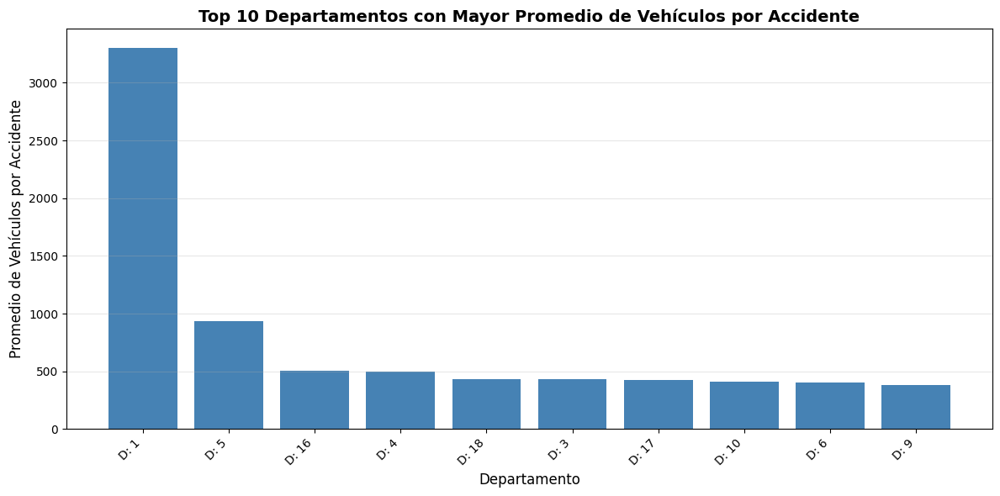

In [0]:
# Guardar en formato Parquet
avg_vehicles_by_depto.write.mode("overwrite").parquet(f"{BASE}/avg_vehicles_by_depto.parquet")

# Obtener los top 10 departamentos
top_10 = avg_vehicles_by_depto.limit(10).toPandas()

# Crear la gráfica
plt.figure(figsize=(12, 6))
plt.bar(top_10['depto_ocu'].apply(lambda it: f"D: {it}"), top_10['promedio_vehiculos'], color='steelblue')
plt.xlabel('Departamento', fontsize=12)
plt.ylabel('Promedio de Vehículos por Accidente', fontsize=12)
plt.title('Top 10 Departamentos con Mayor Promedio de Vehículos por Accidente', fontsize=14, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.grid(axis='y', alpha=0.3)
plt.show()

### 10. Encontrar el top 5 de colores de vehículos más involucrados en accidentes.

In [0]:
avg_vehicles_by_depto = (combined
    .where(combined.marca_veh != "ignorado")
    .groupBy("marca_veh")
    .agg(F.count("*").alias("cuenta_vehiculos"))
    .orderBy("cuenta_vehiculos", ascending=False)
)

# Mostrar los resultados
avg_vehicles_by_depto.limit(5).show()

+----------+----------------+
| marca_veh|cuenta_vehiculos|
+----------+----------------+
|       jmc|           10315|
|    toyota|            9912|
|     bajaj|            7485|
|land rover|            5571|
|    suzuki|            5513|
+----------+----------------+



### 11. Calcular cuántos lesionados por atropello hubo en 2023, por mes. Graficar en serie temporal (línea).

+----------+----------------+
|   mes_ocu|cuenta_vehiculos|
+----------+----------------+
|     abril|             227|
|    agosto|             169|
| diciembre|             289|
|     enero|             185|
|   febrero|             215|
|     julio|             190|
|     junio|             188|
|     marzo|             185|
|      mayo|             215|
| noviembre|             183|
|   octubre|             198|
|septiembre|             199|
+----------+----------------+



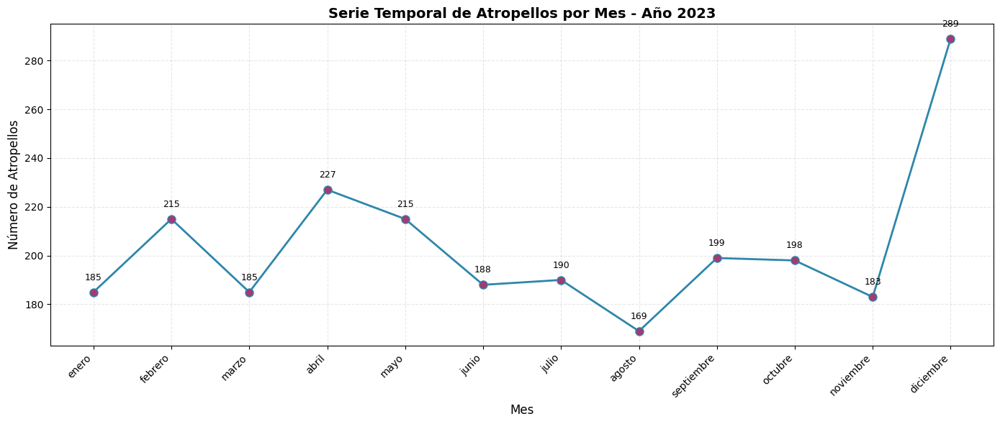

In [0]:
avg_vehicles_by_depto = (combined
    .where(combined.anio_ocu == 2023)
    .where(combined.tipo_eve == "atropello")
    .groupBy("mes_ocu")
    .agg(F.count("*").alias("cuenta_vehiculos"))
    .sort("mes_ocu")
)

avg_vehicles_by_depto.show()

data = avg_vehicles_by_depto.toPandas()

# Definir el orden correcto de los meses
meses_orden = ['enero', 'febrero', 'marzo', 'abril', 'mayo', 'junio', 
               'julio', 'agosto', 'septiembre', 'octubre', 'noviembre', 'diciembre']

# Crear una columna numérica para ordenar correctamente
data['mes_num'] = data['mes_ocu'].apply(lambda x: meses_orden.index(x) + 1)
data = data.sort_values('mes_num')

# Crear la gráfica de serie temporal
plt.figure(figsize=(14, 6))
plt.plot(data['mes_ocu'], data['cuenta_vehiculos'], marker='o', linewidth=2, 
         markersize=8, color='#2E86AB', markerfacecolor='#A23B72')
plt.xlabel('Mes', fontsize=12)
plt.ylabel('Número de Atropellos', fontsize=12)
plt.title('Serie Temporal de Atropellos por Mes - Año 2023', fontsize=14, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.grid(True, alpha=0.3, linestyle='--')
plt.tight_layout()

# Añadir valores en cada punto (opcional)
for i, row in data.iterrows():
    plt.text(row['mes_ocu'], row['cuenta_vehiculos'] + 5, str(row['cuenta_vehiculos']), 
             ha='center', fontsize=9)

plt.show()

### 12. Calcular el total de fallecidos por cada tipo de accidente.

+---------------+----------------+
|       tipo_eve|cuenta_vehiculos|
+---------------+----------------+
|       encuneto|               9|
|       incendio|              13|
|desprendimiento|             203|
|     embarranco|             902|
|       ignorado|            2811|
|          caida|            3325|
|        derrape|            4628|
|         vuelco|            9604|
|         choque|           10352|
|      atropello|           24638|
|       colision|           52932|
+---------------+----------------+



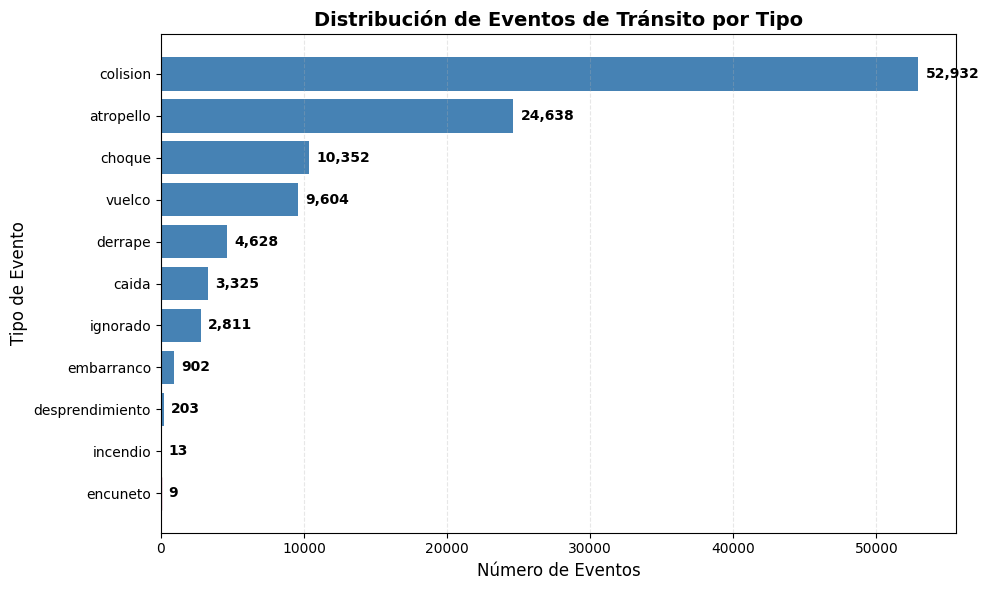

In [0]:
avg_vehicles_by_depto = (combined
    .groupBy("tipo_eve")
    .agg(F.count("*").alias("cuenta_vehiculos"))
    .orderBy("cuenta_vehiculos", ascending=True)
)

avg_vehicles_by_depto.show()

data = avg_vehicles_by_depto.toPandas()

# Crear la gráfica de barras horizontales
plt.figure(figsize=(10, 6))
bars = plt.barh(data['tipo_eve'], data['cuenta_vehiculos'], color='steelblue')

# Colorear la barra más alta de diferente color para destacar
bars[0].set_color('#A23B72')

plt.xlabel('Número de Eventos', fontsize=12)
plt.ylabel('Tipo de Evento', fontsize=12)
plt.title('Distribución de Eventos de Tránsito por Tipo', fontsize=14, fontweight='bold')
plt.grid(axis='x', alpha=0.3, linestyle='--')

# Añadir los valores al final de cada barra
for i, row in data.iterrows():
    plt.text(row['cuenta_vehiculos'] + 500, i, f"{row['cuenta_vehiculos']:,}", 
             va='center', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.show()

### 13. Usar **WithColumn** para franjas

In [0]:

avg_vehicles_by_depto = (combined
    .where(combined.hora_ocu != "Ignorada")
    .withColumn(
        "hora_franja",
        F.when((combined.hora_ocu < 6),"Madrugada")
        .when((combined.hora_ocu >= 6) & (combined.hora_ocu < 12),"Mañana")
        .when((combined.hora_ocu >= 12) & (combined.hora_ocu < 18),"Tarde")
        .when((combined.hora_ocu >= 18) ,"Noche")
    )
    .groupBy("hora_franja")
    .agg(F.count("*").alias("cuenta_franja"))
)

avg_vehicles_by_depto.show()

+-----------+-------------+
|hora_franja|cuenta_franja|
+-----------+-------------+
|  Madrugada|        15661|
|      Tarde|        31677|
|     Mañana|        23511|
|      Noche|        38536|
+-----------+-------------+



### 14. Ratio de fallecidos por accidente en cada departamento

In [0]:
# combined.show()

a = (combined
    .groupBy("depto_ocu")
    .agg(F.count("*").alias("cuenta_accidentes"))
)
b = (combined
    .where(combined.fall_les == "fallecimiento")
    .groupBy("depto_ocu")
    .agg(F.count("*").alias("cuenta_fallecidos"))
)

avg_vehicles_by_depto = a.join(b, a.depto_ocu == b.depto_ocu).select(a.depto_ocu, b.cuenta_fallecidos, a.cuenta_accidentes).withColumn("ratio", F.round(F.col("cuenta_fallecidos") / F.col("cuenta_accidentes"), 2)).orderBy("depto_ocu")

avg_vehicles_by_depto.show()

avg_vehicles_by_depto.write.mode("overwrite").parquet(f"{BASE}/ratio_dead_by_depto.parquet")

+---------+-----------------+-----------------+-----+
|depto_ocu|cuenta_fallecidos|cuenta_accidentes|ratio|
+---------+-----------------+-----------------+-----+
|        1|             3570|            36356|  0.1|
|        2|              396|             2809| 0.14|
|        3|              456|             3871| 0.12|
|        4|              703|             4457| 0.16|
|        5|             1746|             9370| 0.19|
|        6|              631|             4052| 0.16|
|        7|              359|             2214| 0.16|
|        8|              181|             1139| 0.16|
|        9|              594|             3776| 0.16|
|       10|              553|             3666| 0.15|
|       11|              408|             2921| 0.14|
|       12|              394|             2812| 0.14|
|       13|              431|             2599| 0.17|
|       14|              351|             3059| 0.11|
|       15|              219|             2271|  0.1|
|       16|              703

### 15. Identificar los grupos de edad más afectados en fallecidos y lesionados.

+-------+-----------+--------+------+---------+---------+--------+-----------+-----------+---------+----------+----------+-------------+--------+-----------+-------------+--------+-----------+---------+----------------+--------+--------+
|mes_ocu|dia_sem_ocu|hora_ocu|g_hora|depto_ocu|mupio_ocu|zona_ocu|mayor_menor|   tipo_veh|color_veh|modelo_veh| marca_veh|anio_ocu_file|tipo_eve| edad_grupo|     fall_les|sexo_vic|int_o_noint|num_corre|anio_ocu_dataset|anio_ocu|edad_vic|
+-------+-----------+--------+------+---------+---------+--------+-----------+-----------+---------+----------+----------+-------------+--------+-----------+-------------+--------+-----------+---------+----------------+--------+--------+
|  enero|     martes|       5|     1|        1|      101|      11|      mayor|  automovil|   blanco|         5|    avanti|         2013|  choque|      30-34|    lesionado|ignorado|   ignorado|        1|            NULL|    2013|      -1|
|  enero|     martes|       5|     1|        1| 

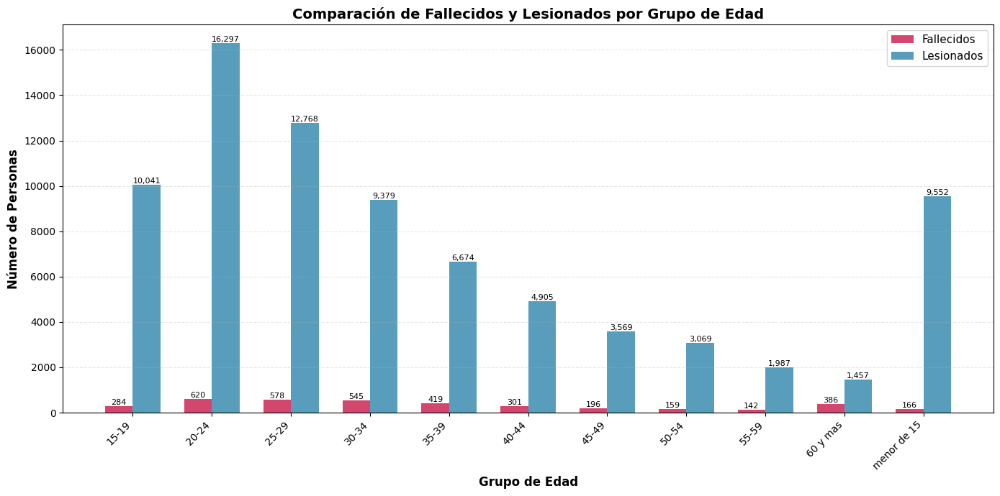

In [0]:
combined.show()

a = (combined
    .where(combined.fall_les == "fallecido")
    .where(combined.edad_grupo != "ignorado")
    .groupBy("edad_grupo")
    .agg(F.count("*").alias("total_fallecidos"))
)
b = (combined
    .where(combined.fall_les == "lesionado")
    .where(combined.edad_grupo != "ignorado")
    .groupBy("edad_grupo")
    .agg(F.count("*").alias("total_lesionados"))
)

edad_analysis = a.join(b, a.edad_grupo == b.edad_grupo).select(a.edad_grupo, b.total_lesionados, a.total_fallecidos).orderBy(a.edad_grupo)

# Convertir a Pandas
data = edad_analysis.toPandas()

# Crear gráfica de barras agrupadas
fig, ax = plt.subplots(figsize=(14, 7))

x = np.arange(len(data['edad_grupo']))
width = 0.35

bars1 = ax.bar(x - width/2, data['total_fallecidos'], width, 
               label='Fallecidos', color='#C9184A', alpha=0.8)
bars2 = ax.bar(x + width/2, data['total_lesionados'], width, 
               label='Lesionados', color='#2E86AB', alpha=0.8)

ax.set_xlabel('Grupo de Edad', fontsize=12, fontweight='bold')
ax.set_ylabel('Número de Personas', fontsize=12, fontweight='bold')
ax.set_title('Comparación de Fallecidos y Lesionados por Grupo de Edad', 
             fontsize=14, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(data['edad_grupo'], rotation=45, ha='right')
ax.legend(fontsize=11)
ax.grid(axis='y', alpha=0.3, linestyle='--')

# Añadir valores en las barras
for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        if height > 0:
            ax.text(bar.get_x() + bar.get_width()/2., height,
                   f'{int(height):,}',
                   ha='center', va='bottom', fontsize=8)

plt.tight_layout()
plt.show()

### 16. Calcular, para el municipio de Guatemala, cuántos accidentes hay por zona y cuántos fallecidos se reportan en cada una.

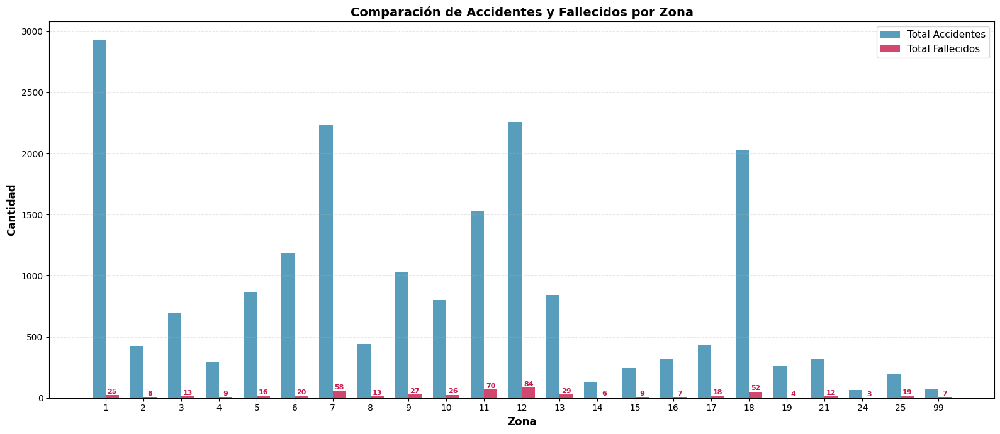

In [0]:
# combined.show()

a = (combined
    .where(combined.fall_les == "fallecido")
    .where(combined.mupio_ocu == 101)
    .groupBy("zona_ocu")
    .agg(F.count("*").alias("total_fallecidos"))
)

b = (combined
    .where(combined.mupio_ocu == 101)
    .groupBy("zona_ocu")
    .agg(F.count("*").alias("total_accidentes"))
)

zonas = a.join(b, a.zona_ocu == b.zona_ocu).select(a.zona_ocu, b.total_accidentes, a.total_fallecidos).orderBy(a.zona_ocu)

data = zonas.toPandas()
data = data.sort_values('zona_ocu')

# Crear gráfica de barras agrupadas
fig, ax = plt.subplots(figsize=(16, 7))

x = np.arange(len(data['zona_ocu']))
width = 0.35

bars1 = ax.bar(x - width/2, data['total_accidentes'], width, 
               label='Total Accidentes', color='#2E86AB', alpha=0.8)
bars2 = ax.bar(x + width/2, data['total_fallecidos'], width, 
               label='Total Fallecidos', color='#C9184A', alpha=0.8)

ax.set_xlabel('Zona', fontsize=12, fontweight='bold')
ax.set_ylabel('Cantidad', fontsize=12, fontweight='bold')
ax.set_title('Comparación de Accidentes y Fallecidos por Zona', 
             fontsize=14, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(data['zona_ocu'].astype(int), rotation=0)
ax.legend(fontsize=11, loc='upper right')
ax.grid(axis='y', alpha=0.3, linestyle='--')

# Añadir valores en las barras de fallecidos (más importantes)
for i, (idx, row) in enumerate(data.iterrows()):
    ax.text(i + width/2, row['total_fallecidos'] + 1, 
            str(int(row['total_fallecidos'])),
            ha='center', va='bottom', fontsize=8, color='#C9184A', fontweight='bold')

plt.tight_layout()
plt.show()

### 17. Porcentaje de accidentes donde el conductor era hombre vs mujer



+-------+-------+------+------------------+-------------------+
|hombres|mujeres| total|porcentaje_hombres| porcentaje_mujeres|
+-------+-------+------+------------------+-------------------+
|  91799|   6947|111988|0.8197217559024181|0.06203343215344501|
+-------+-------+------+------------------+-------------------+

Datos cargados desde Parquet:
+-------+-------+------+------------------+-------------------+
|hombres|mujeres| total|porcentaje_hombres| porcentaje_mujeres|
+-------+-------+------+------------------+-------------------+
|  91799|   6947|111988|0.8197217559024181|0.06203343215344501|
+-------+-------+------+------------------+-------------------+



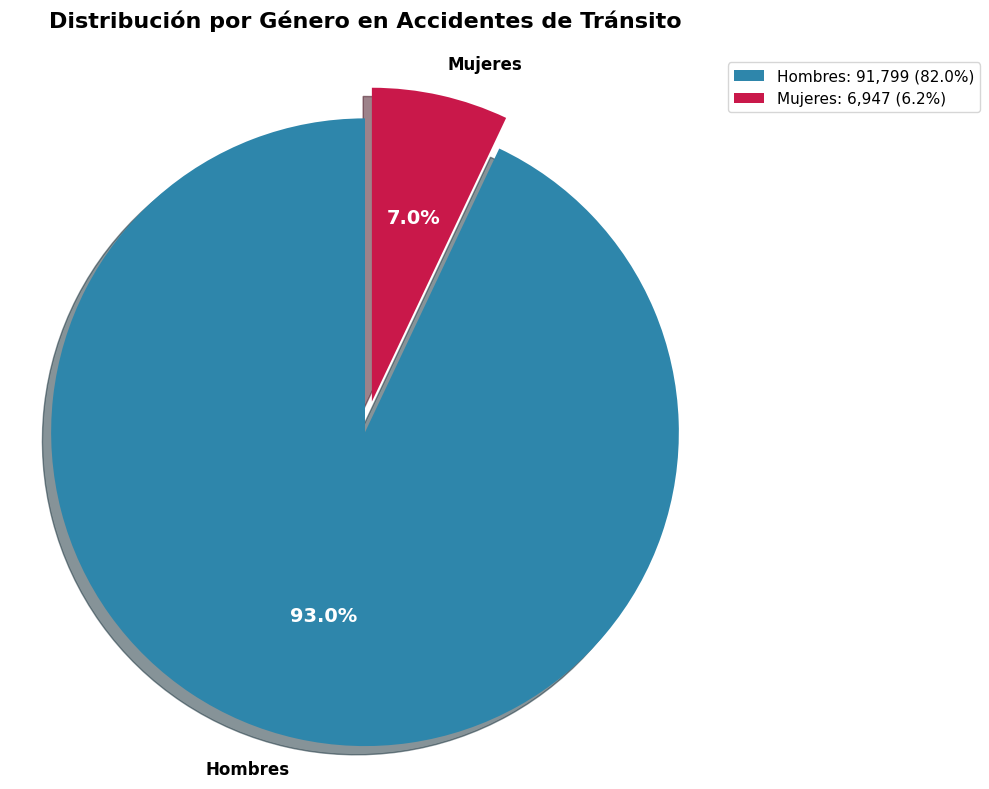

In [0]:
# vehiculos.show()

gender = (vehiculos
    .agg(
        F.sum(F.when(vehiculos.sex_cond == "hombre", 1).otherwise(0)).alias("hombres"),
        F.sum(F.when(vehiculos.sex_cond == "mujer", 1).otherwise(0)).alias("mujeres"),
        F.count("*").alias("total")
    )
)

gender = gender.withColumn("porcentaje_hombres", (gender.hombres / gender.total)).withColumn("porcentaje_mujeres", (gender.mujeres / gender.total))

gender.show()

# Guardar el DataFrame en formato Parquet
gender.write.mode("overwrite").parquet(f"{BASE}/gender_statistics.parquet")

# Cargar el DataFrame desde el archivo Parquet
gender_loaded = spark.read.parquet(f"{BASE}/gender_statistics.parquet")

# Verificar que se cargó correctamente
print("Datos cargados desde Parquet:")
gender_loaded.show()

# Convertir gender Pandas para graficar
data = gender_loaded.toPandas()

# Extraer los porcentajes
porcentajes = [
    data['porcentaje_hombres'].iloc[0] * 100,
    data['porcentaje_mujeres'].iloc[0] * 100
]

labels = ['Hombres', 'Mujeres']
colors = ['#2E86AB', '#C9184A']
explode = (0.05, 0.05)  # Separar ligeramente las secciones

# Crear el gráfico de pie
plt.figure(figsize=(10, 8))
wedges, texts, autotexts = plt.pie(porcentajes, 
                                     labels=labels, 
                                     autopct='%1.1f%%',
                                     startangle=90,
                                     colors=colors,
                                     explode=explode,
                                     shadow=True,
                                     textprops={'fontsize': 12, 'fontweight': 'bold'})

# Mejorar la apariencia de los porcentajes
for autotext in autotexts:
    autotext.set_color('white')
    autotext.set_fontsize(14)
    autotext.set_fontweight('bold')

plt.title('Distribución por Género en Accidentes de Tránsito', 
          fontsize=16, fontweight='bold', pad=20)

# Añadir leyenda con números absolutos
legend_labels = [
    f'Hombres: {int(data["hombres"].iloc[0]):,} ({porcentajes[0]:.1f}%)',
    f'Mujeres: {int(data["mujeres"].iloc[0]):,} ({porcentajes[1]:.1f}%)'
]
plt.legend(legend_labels, loc='upper left', bbox_to_anchor=(1, 1), fontsize=11)

plt.axis('equal')  # Para que el pie sea circular
plt.tight_layout()
plt.show()
